# Import libraries

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install git+https://github.com/albumentations-team/albumentations.git
!pip install torchsummary

  Cloning https://github.com/albumentations-team/albumentations.git to /tmp/pip-req-build-okwd_ywi
  Running command git clone -q https://github.com/albumentations-team/albumentations.git /tmp/pip-req-build-okwd_ywi
  Created wheel for albumentations: filename=albumentations-1.0.0-cp37-none-any.whl size=98531 sha256=87d137f2708626c254106309b1b6a61e9f4205d3190dc5687a94a9416b18c36b
  Stored in directory: /tmp/pip-ephem-wheel-cache-opxahn7p/wheels/e2/85/3e/2a40fac5cc1f43ced656603bb2fca1327b30ec7de1b1b66517
Successfully built albumentations
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [4]:
!git clone https://github.com/gkdivya/torch_cv_wrapper.git

Cloning into 'torch_cv_wrapper'...
remote: Enumerating objects: 268, done.
remote: Counting objects: 100% (268/268), done.
remote: Compressing objects: 100% (258/258), done.
remote: Total 268 (delta 155), reused 0 (delta 0), pack-reused 0
Receiving objects: 100% (268/268), 63.98 KiB | 1.68 MiB/s, done.
Resolving deltas: 100% (155/155), done.


In [5]:
from __future__ import print_function
import torchvision
import torch
from pprint import pprint
# Let's visualize some of the images
%matplotlib inline
import matplotlib.pyplot as plt

## Import Custom Libraries
from torch_cv_wrapper.utils import plot_metrics,train,test,helper
from torch_cv_wrapper.utils.gradcam import generate_gradcam, plot_gradcam
from torch_cv_wrapper.model import resnet
from torch_cv_wrapper.main import TriggerEngine

## Load config file

In [6]:
config = helper.process_config("/content/drive/MyDrive/Cifar10_Resnet/session8_assignment/Cifar10_with_resnet18_BN_RedLR.yml")
use_cuda = torch.cuda.is_available()
helper.set_seed(config['model_params']['seed'],use_cuda)
device = torch.device("cuda" if use_cuda else "cpu")
pprint(config)

 loading Configuration of your experiment ..
{'criterion': 'CrossEntropyLoss',
 'data_augmentation': {'type': 'CIFAR10Albumentation'},
 'data_loader': {'args': {'batch_size': 256,
                          'num_workers': 2,
                          'pin_memory': True},
                 'classes': ['plane',
                             'car',
                             'bird',
                             'cat',
                             'deer',
                             'dog',
                             'frog',
                             'horse',
                             'ship',
                             'truck'],
                 'type': 'Cifar10DataLoader'},
 'lr_scheduler': 'ReduceLROnPlateau',
 'model': 'Resnet18',
 'model_params': {'dropout': 0.05,
                  'experiment_name': 'Cifar10_with_resnet18_LN_RedLR',
                  'model_dir': './model/',
                  'seed': 1},
 'optimizer': {'args': {'lr': 0.001}, 'type': 'optim.Adam'},
 'training_

## Create Training Instance

In [7]:
exp_metrics={}
experiment_name=config['model_params']['experiment_name']
trigger_training=TriggerEngine(config)

## Download data and view sample images

In [8]:
classes= config['data_loader']['classes']

#Get dataloaders
train_loader,test_loader = trigger_training.dataloader()


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


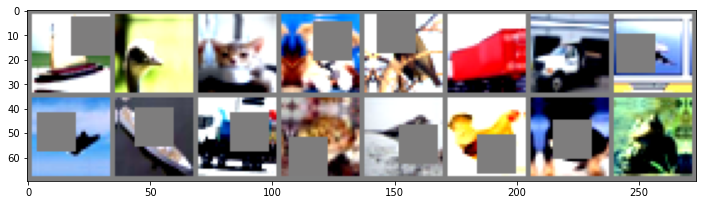

In [9]:
# get some random training images
images, labels = iter(train_loader).next()

# # show images
helper.imshow(torchvision.utils.make_grid(images[:16]))

## Model Summary

In [10]:
model = resnet.ResNet18("BN")
model.to(device)
trigger_training.model_summary(model,(3,32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
       BatchNorm2d-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
       BatchNorm2d-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
       BatchNorm2d-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
      BatchNorm2d-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
      BatchNorm2d-14          [-1, 128,

## Trigger training

In [11]:
# trigger_training.
(exp_metrics[experiment_name]) = trigger_training.run_experiment(model,train_loader,test_loader)
#trigger_training.save_experiment(model,experiment_name,"/content/drive/MyDrive/Cifar10_Resnet/saved_models")

  0%|          | 0/196 [00:00<?, ?it/s]

Epoch 1:


Loss=1.4207184314727783 Batch_id=195 LR=0.00100 Accuracy=37.48: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0066, Accuracy: 4207/10000 (42.07%)

Epoch 2:


Loss=1.1938397884368896 Batch_id=195 LR=0.00100 Accuracy=51.56: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0046, Accuracy: 5909/10000 (59.09%)

Epoch 3:


Loss=1.1625422239303589 Batch_id=195 LR=0.00100 Accuracy=59.50: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0047, Accuracy: 6082/10000 (60.82%)

Epoch 4:


Loss=1.1028025150299072 Batch_id=195 LR=0.00100 Accuracy=64.14: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0044, Accuracy: 6153/10000 (61.53%)

Epoch 5:


Loss=1.0351488590240479 Batch_id=195 LR=0.00100 Accuracy=67.92: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0035, Accuracy: 7001/10000 (70.01%)

Epoch 6:


Loss=0.9209710955619812 Batch_id=195 LR=0.00100 Accuracy=70.46: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7421/10000 (74.21%)

Epoch 7:


Loss=0.7374403476715088 Batch_id=195 LR=0.00100 Accuracy=73.00: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0036, Accuracy: 7080/10000 (70.80%)

Epoch 8:


Loss=0.5930081605911255 Batch_id=195 LR=0.00100 Accuracy=75.12: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7647/10000 (76.47%)

Epoch 9:


Loss=0.9767452478408813 Batch_id=195 LR=0.00100 Accuracy=76.58: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0030, Accuracy: 7449/10000 (74.49%)

Epoch 10:


Loss=0.6959412097930908 Batch_id=195 LR=0.00100 Accuracy=78.15: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0032, Accuracy: 7415/10000 (74.15%)

Epoch 11:


Loss=0.6617997884750366 Batch_id=195 LR=0.00100 Accuracy=79.12: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0031, Accuracy: 7556/10000 (75.56%)

Epoch 12:


Loss=0.6800236105918884 Batch_id=195 LR=0.00100 Accuracy=79.91: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8212/10000 (82.12%)

Epoch 13:


Loss=0.5930450558662415 Batch_id=195 LR=0.00100 Accuracy=80.84: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7555/10000 (75.55%)

Epoch 14:


Loss=0.5112645030021667 Batch_id=195 LR=0.00100 Accuracy=81.53: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0019, Accuracy: 8426/10000 (84.26%)

Epoch 15:


Loss=0.4574982225894928 Batch_id=195 LR=0.00100 Accuracy=82.54: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7697/10000 (76.97%)

Epoch 16:


Loss=0.6080910563468933 Batch_id=195 LR=0.00100 Accuracy=83.38: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0029, Accuracy: 7755/10000 (77.55%)

Epoch 17:


Loss=0.396109402179718 Batch_id=195 LR=0.00100 Accuracy=83.82: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0021, Accuracy: 8275/10000 (82.75%)

Epoch 18:


Loss=0.38966721296310425 Batch_id=195 LR=0.00100 Accuracy=84.46: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0023, Accuracy: 8103/10000 (81.03%)

Epoch    18: reducing learning rate of group 0 to 2.0000e-04.
Epoch 19:


Loss=0.21285362541675568 Batch_id=195 LR=0.00020 Accuracy=88.87: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9055/10000 (90.55%)

Epoch 20:


Loss=0.1738525629043579 Batch_id=195 LR=0.00020 Accuracy=89.93: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9032/10000 (90.32%)

Epoch 21:


Loss=0.37151041626930237 Batch_id=195 LR=0.00020 Accuracy=90.75: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9057/10000 (90.57%)

Epoch 22:


Loss=0.16982409358024597 Batch_id=195 LR=0.00020 Accuracy=90.76: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9062/10000 (90.62%)

Epoch 23:


Loss=0.25225475430488586 Batch_id=195 LR=0.00020 Accuracy=91.00: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9024/10000 (90.24%)

Epoch 24:


Loss=0.22856374084949493 Batch_id=195 LR=0.00020 Accuracy=91.61: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9035/10000 (90.35%)

Epoch 25:


Loss=0.30300530791282654 Batch_id=195 LR=0.00020 Accuracy=91.69: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9008/10000 (90.08%)

Epoch 26:


Loss=0.20027275383472443 Batch_id=195 LR=0.00020 Accuracy=92.19: 100%|██████████| 196/196 [00:56<00:00,  3.47it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9075/10000 (90.75%)

Epoch 27:


Loss=0.18309061229228973 Batch_id=195 LR=0.00020 Accuracy=92.35: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9007/10000 (90.07%)

Epoch 28:


Loss=0.26320624351501465 Batch_id=195 LR=0.00020 Accuracy=92.56: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9090/10000 (90.90%)

Epoch 29:


Loss=0.23013117909431458 Batch_id=195 LR=0.00020 Accuracy=92.66: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0013, Accuracy: 9054/10000 (90.54%)

Epoch 30:


Loss=0.2539992332458496 Batch_id=195 LR=0.00020 Accuracy=92.80: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9076/10000 (90.76%)

Epoch 31:


Loss=0.2107691466808319 Batch_id=195 LR=0.00020 Accuracy=93.17: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9146/10000 (91.46%)

Epoch 32:


Loss=0.3126932382583618 Batch_id=195 LR=0.00020 Accuracy=93.34: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9054/10000 (90.54%)

Epoch 33:


Loss=0.17167088389396667 Batch_id=195 LR=0.00020 Accuracy=93.45: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9139/10000 (91.39%)

Epoch 34:


Loss=0.17172493040561676 Batch_id=195 LR=0.00020 Accuracy=93.64: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0011, Accuracy: 9117/10000 (91.17%)

Epoch 35:


Loss=0.14571037888526917 Batch_id=195 LR=0.00020 Accuracy=93.79: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0012, Accuracy: 9129/10000 (91.29%)

Epoch    35: reducing learning rate of group 0 to 4.0000e-05.
Epoch 36:


Loss=0.11545757204294205 Batch_id=195 LR=0.00004 Accuracy=94.89: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9252/10000 (92.52%)

Epoch 37:


Loss=0.15006941556930542 Batch_id=195 LR=0.00004 Accuracy=95.41: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0009, Accuracy: 9255/10000 (92.55%)

Epoch 38:


Loss=0.14713652431964874 Batch_id=195 LR=0.00004 Accuracy=95.61: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9256/10000 (92.56%)

Epoch 39:


Loss=0.09745068848133087 Batch_id=195 LR=0.00004 Accuracy=95.55: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]
  0%|          | 0/196 [00:00<?, ?it/s]


Test set: Average loss: 0.0010, Accuracy: 9248/10000 (92.48%)

Epoch 40:


Loss=0.0963878482580185 Batch_id=195 LR=0.00004 Accuracy=95.79: 100%|██████████| 196/196 [00:56<00:00,  3.46it/s]



Test set: Average loss: 0.0010, Accuracy: 9272/10000 (92.72%)



## Missclassification

Total wrong predictions are 728
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


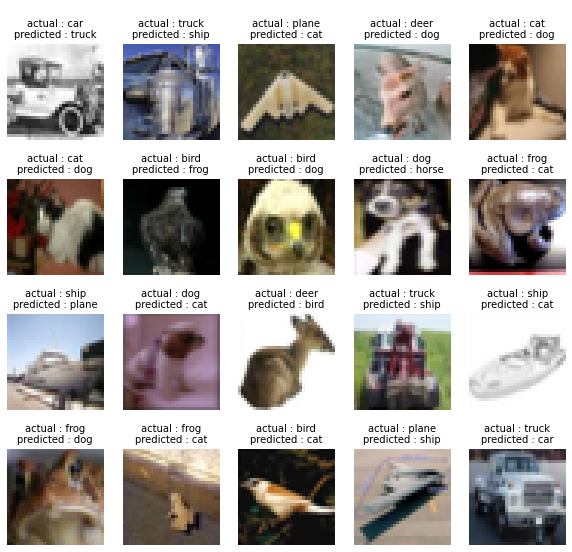

In [12]:
misclassified_images = trigger_training.wrong_predictions(model,test_loader)

## Plots for Validation Loss and Accuracy

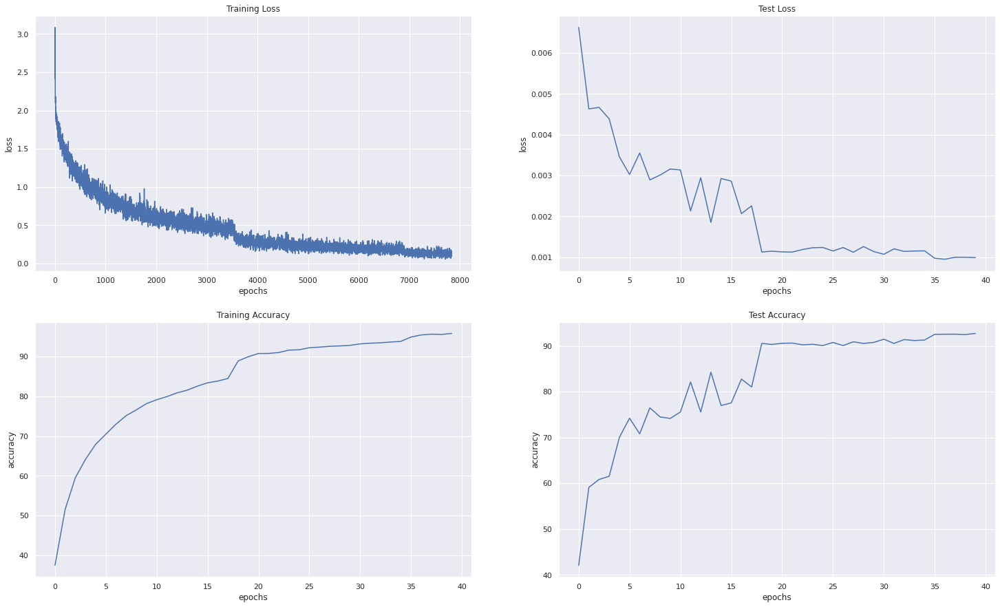

In [13]:
plot_metrics.plot_metrics(exp_metrics[experiment_name])

## Accuracy for each class

In [14]:
helper.class_level_accuracy(model, test_loader, device, classes)

Accuracy of plane : 94 %
Accuracy of   car : 97 %
Accuracy of  bird : 87 %
Accuracy of   cat : 86 %
Accuracy of  deer : 92 %
Accuracy of   dog : 87 %
Accuracy of  frog : 96 %
Accuracy of horse : 94 %
Accuracy of  ship : 95 %
Accuracy of truck : 94 %


## Plot Confusion Matrix

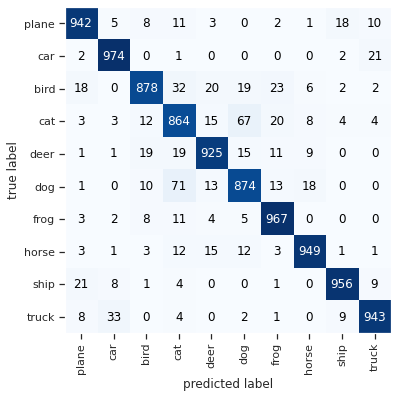

In [15]:
mat = helper.compute_confusion_matrix(model,test_loader,device)
plot_metrics.plot_confusion_matrix(mat, class_names=classes)


## Generate & Plot GradCam Images

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


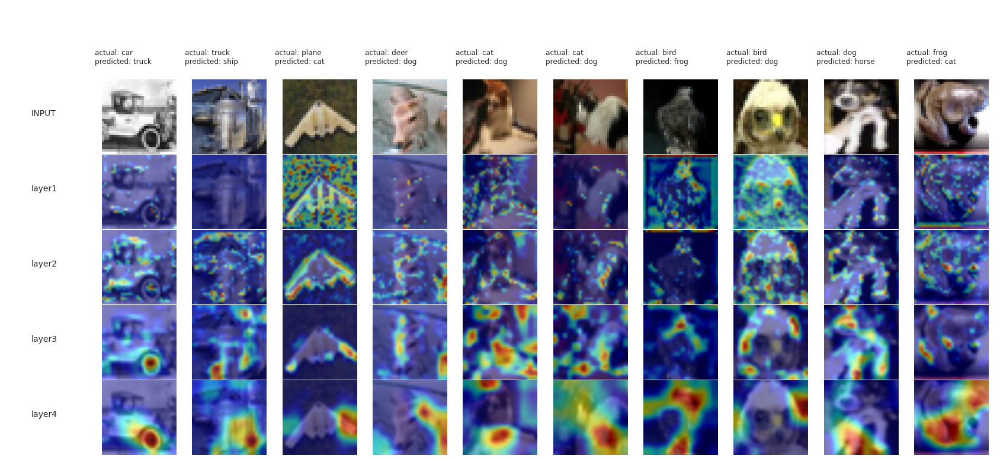

In [16]:
target_layers = ["layer1","layer2","layer3","layer4"]
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[:10], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[:10])

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


torch.Size([10, 10])
Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


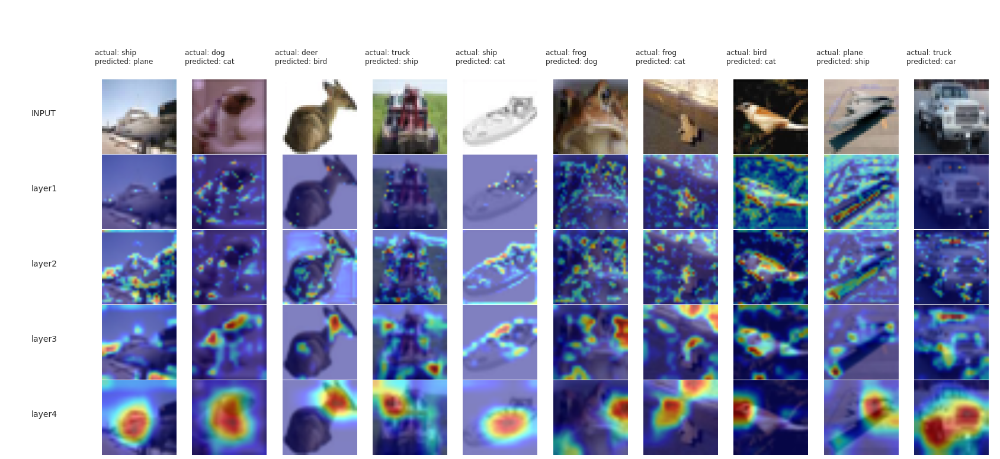

In [17]:
gradcam_output, probs, predicted_classes = generate_gradcam(misclassified_images[10:20], model, target_layers,device)
plot_gradcam(gradcam_output, target_layers, classes, (3, 32, 32),predicted_classes, misclassified_images[10:20])

In [18]:

%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>